# Aquarium Object Detection
## From-Scratch Grid Detector vs. Faster R-CNN Transfer Learning

**Neural Networks Laboratory — Final Project, Academic Year 2025–2026**

| | |
|---|---|
| **Section** | `` |
| **Student 1** | `Ammar Azoubi` |
| **Student 2** | `Ghaith Khawly` |
| **Instructor** | ENG. Samma ALMuhammad |

---

This notebook is the primary documentation for the project. It runs end to end
and contains every result quoted in the submission.

**What is compared, and why.** Two detectors are trained on the same task, the
same split, and the same preprocessing:

1. **Model 1 — a grid detector built from scratch.** The architecture, the
   target encoding, the multi-task loss, IoU, non-maximum suppression and the
   decoding are all implemented in this repository. Nothing about it is
   imported from a detection library.
2. **Model 2 — Faster R-CNN (ResNet-50 + FPN), COCO-pretrained, fine-tuned.**
   This is the modern course technique: transfer learning with meaningful
   adaptation.

Comparing two off-the-shelf detectors would mostly measure library defaults.
Pairing a from-scratch dense detector with a fine-tuned two-stage one isolates
the two things this project is actually about: **what pretraining buys in
accuracy, and what it costs at inference time.**

**How to run this notebook.** Top to bottom. Set `RETRAIN = False` in
section 8 to load the supplied checkpoints instead of training — inference,
evaluation, failure analysis and the real-world demo all work from saved
weights alone.

---
# 1. Problem Formulation

**The problem.** Given an underwater photograph, locate every aquatic creature
in it and name its species. Formally, a mapping from an RGB image to a variable
length set of `(box, class, confidence)` triples — a *detection* problem, not a
classification one, because the number of objects is not known in advance and
their positions matter.

**Why it matters.** Aquariums and marine surveys generate far more footage than
anyone can annotate by hand. Population counts, species presence, and behaviour
studies all currently bottleneck on a human watching video. An automatic
detector turns a manual counting task into a reviewable one.

| | |
|---|---|
| **Input** | RGB image, any resolution, resized to 224×224 |
| **Output** | set of bounding boxes, each with one of 7 class labels and a confidence in [0,1] |
| **Users** | aquarium monitoring operators, marine-survey researchers |
| **Operating mode** | offline batch analysis; latency is measured so real-time feasibility can be judged rather than assumed |
| **Classes** | fish, jellyfish, penguin, puffin, shark, starfish, stingray |

**Why this is hard.** Underwater imagery breaks most of the assumptions that
make detection easy: water absorbs red light so colour is unreliable, particles
scatter light so contrast is low, animals occlude each other heavily in schools,
and the same species appears at wildly different scales depending on distance
from the camera.

The measurements in section 3 quantify this. The decisive one: **76% of the
annotated objects are smaller than 32×32 pixels** at the working resolution,
with a median object of just 23×16 px. Scenes hold 7.4 objects on average but
up to 56. A detector whose output grid is coarse relative to that is beaten
before training starts — which is why section 4 measures the grid resolution
rather than assuming one.

### System workflow

Everything outside the two model blocks is shared. That is what makes the
comparison controlled: a difference in the measured numbers cannot be blamed on
one model having received better-preprocessed images or friendlier
post-processing.

In [1]:
# --- Project setup ------------------------------------------------------
import sys
from pathlib import Path

# Locate the project root (the folder containing src/) whether this notebook
# is opened from the root or from a subfolder.
PROJECT_ROOT = Path.cwd()
for candidate in (PROJECT_ROOT, *PROJECT_ROOT.parents):
    if (candidate / "src" / "config.py").exists():
        PROJECT_ROOT = candidate
        break
else:
    raise RuntimeError(
        "Could not find src/config.py. Run this notebook from the project root "
        "(the folder containing src/, scripts/ and requirements.txt)."
    )

sys.path.insert(0, str(PROJECT_ROOT))
print("Project root:", PROJECT_ROOT)

# On Colab only `roboflow` is missing; everything else is preinstalled.
try:
    import roboflow  # noqa: F401
except ImportError:
    print("installing roboflow...")
    import subprocess
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "roboflow"], check=False)

Project root: G:\03_Projects\Active\uni\nn\finalproject


In [2]:
# --- Imports and reproducibility ---------------------------------------
import numpy as np
import matplotlib.pyplot as plt
import torch

from src.config import (
    CHECKPOINT_DIR, DATA_DIR, FIGURES_DIR, REAL_WORLD_DIR, RESULTS_DIR,
    Config, ensure_directories,
)
from src.utils import (
    count_parameters, format_hardware, hardware_report, model_size_mb,
    save_json, set_seed,
)
from src import eda, viz

ensure_directories()

cfg = Config()
set_seed(cfg.seed, cfg.deterministic)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Hardware : {format_hardware()}")
print(f"Device   : {DEVICE}")
print(f"Seed     : {cfg.seed} (deterministic={cfg.deterministic})")
print(f"Classes  : {cfg.class_names}")
print(f"Input    : {cfg.img_size}x{cfg.img_size}   Grid: {cfg.grid_size}x{cfg.grid_size}")

Hardware : CPU only | torch 2.13.0+cpu | Python 3.12.10
Device   : cpu
Seed     : 42 (deterministic=True)
Classes  : ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
Input    : 224x224   Grid: 14x14


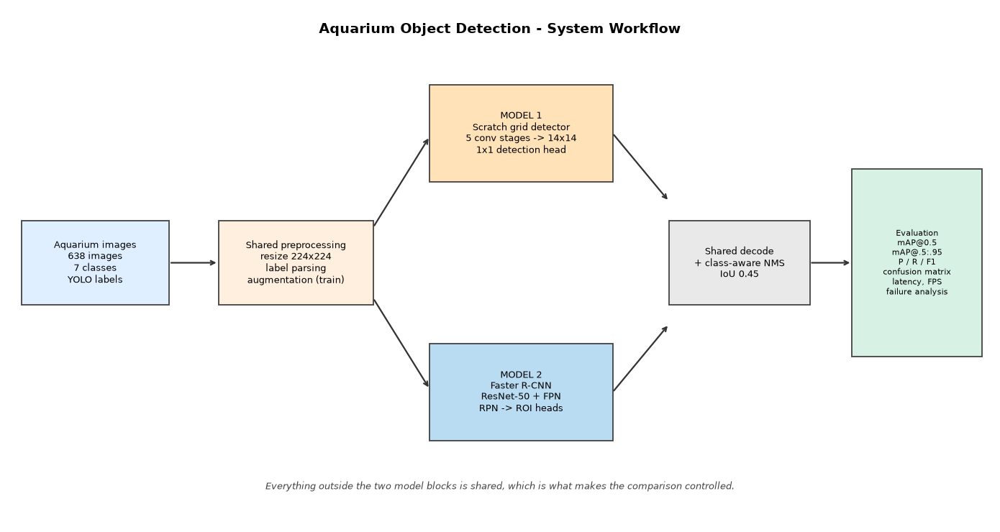

In [3]:
# --- System workflow diagram (requirement 1) ---------------------------
fig = viz.plot_architecture_diagram(FIGURES_DIR / "system_workflow.png")
plt.show()

---
# 2. Dataset

| | |
|---|---|
| **Name** | Aquarium Combined |
| **Source** | https://universe.roboflow.com/brad-dwyer/aquarium-combined (version 2) |
| **License** | CC BY 4.0 |
| **Size** | 638 images, 4,817 annotated objects |
| **Classes** | 7: fish, jellyfish, penguin, puffin, shark, starfish, stingray |
| **Annotation** | axis-aligned bounding boxes, YOLO `.txt` format |
| **Resolution** | 576–1024 px, mixed aspect ratios |
| **Split** | 448 train / 127 valid / 63 test, as published by the source |

### Label format

Each image has a matching `.txt` file; one line per object:

$$\texttt{class} \quad x_c \quad y_c \quad w \quad h$$

with $x_c, y_c, w, h \in [0,1]$ normalised by image width and height. Storing
coordinates as fractions rather than pixels is what lets us resize freely — the
labels stay valid under any resize, which matters because both models consume
224×224 input while the source images vary.

### Why this dataset suits the problem

- **Crowded and variable**: 7.4 objects per image on average, but up to 56, so a
  single image exercises occlusion, crowding and NMS behaviour at once — exactly
  the conditions that separate a dense single-shot detector from a two-stage one.
- **Dominated by small objects** (76% below 32×32 px), which is the property
  that most sharply distinguishes the two architectures under test.
- **Genuinely difficult**: turbid water, glass reflections, motion blur.
- **Strongly imbalanced** (23:1), which forces the evaluation to report
  per-class AP rather than hiding a never-detected class behind a healthy
  average.
- **Small enough** to train two models within a lab compute budget.

Every number above is measured in section 3, not quoted from the dataset page.

The dataset is not bundled with the submission; the cell below fetches it.

In [4]:
# --- Get the dataset ----------------------------------------------------
# The API key is read from the environment or typed at a hidden prompt.
# It is never written into this notebook: a committed key is a live
# credential visible to anyone who opens the submission.
import os
import subprocess

if not (DATA_DIR / "train" / "images").is_dir():
    if not os.environ.get("ROBOFLOW_API_KEY"):
        from getpass import getpass
        os.environ["ROBOFLOW_API_KEY"] = getpass("Roboflow API key (hidden): ")

    # subprocess rather than an IPython `!` magic, so this cell also runs
    # under plain nbconvert or a non-IPython kernel.
    result = subprocess.run(
        [sys.executable, str(PROJECT_ROOT / "scripts" / "download_data.py")],
        capture_output=True, text=True,
    )
    print(result.stdout)
    if result.returncode != 0:
        print(result.stderr)
        raise RuntimeError(
            "Dataset download failed. See the manual placement instructions "
            "in README section 3."
        )
else:
    print(f"Dataset already present at {DATA_DIR}")

for split in ("train", "valid", "test"):
    n = len(list((DATA_DIR / split / "images").glob("*")))
    print(f"  {split:<6} {n:>4} images")

Dataset already present at G:\03_Projects\Active\uni\nn\finalproject\data
  train   448 images
  valid   127 images
  test     63 images


---
# 3. Exploration and Data Quality

Before any modelling, the dataset is audited: class balance, image quality,
corrupted files, duplicates, label validity, and object scale. Each of these
either changes a design decision later or changes how the results must be read.

In [5]:
# --- 3.1 Split sizes and object density --------------------------------
overview = eda.split_overview(DATA_DIR, cfg)

print(f"{'split':<8}{'images':>8}{'share':>9}{'objects':>10}{'obj/img':>10}{'empty':>8}")
print("-" * 53)
for split, row in overview["per_split"].items():
    print(f"{split:<8}{row['images']:>8}{row['share_pct']:>8.1f}%{row['objects']:>10}"
          f"{row['objects_per_image']:>10.1f}{row['empty_images']:>8}")
print("-" * 53)
print(f"{'total':<8}{overview['total_images']:>8}")

split     images    share   objects   obj/img   empty
-----------------------------------------------------
train        448    70.2%      3324       7.4       1
valid        127    19.9%       909       7.2       0
test          63     9.9%       584       9.3       0
-----------------------------------------------------
total        638


Objects per class (all splits):
  fish          2669    55.4%  #######################################################
  jellyfish      694    14.4%  ##############
  penguin        516    10.7%  ##########
  shark          354     7.3%  #######
  puffin         284     5.9%  #####
  stingray       184     3.8%  ###
  starfish       116     2.4%  ##

Imbalance ratio (most common : rarest) = 23.0 : 1
Most common: fish   Rarest: starfish


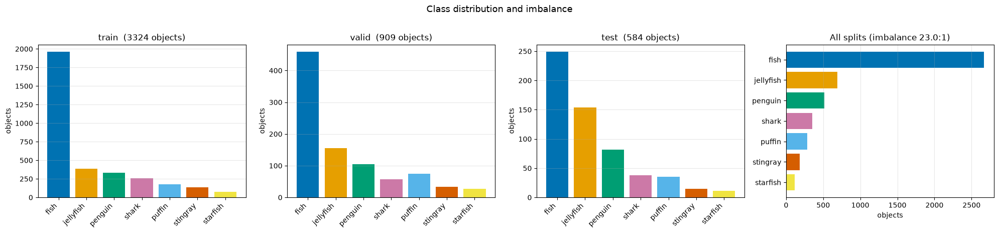

In [6]:
# --- 3.2 Class balance --------------------------------------------------
distribution = eda.class_distribution(DATA_DIR, cfg)

print("Objects per class (all splits):")
for name, count in sorted(distribution["totals"].items(), key=lambda kv: -kv[1]):
    share = 100 * count / sum(distribution["totals"].values())
    print(f"  {name:<12}{count:>6}   {share:>5.1f}%  {'#' * int(share)}")

print(f"\nImbalance ratio (most common : rarest) = {distribution['imbalance_ratio']:.1f} : 1")
print(f"Most common: {distribution['most_common']}   Rarest: {distribution['rarest']}")

fig = viz.plot_class_distribution(distribution, FIGURES_DIR / "eda_class_distribution.png")
plt.show()

**Reading the imbalance.** One class dominates the dataset by a wide margin.
Two consequences follow, and both are acted on later:

1. A micro-averaged score would be almost entirely determined by the majority
   class. The evaluation therefore reports **per-class AP** and takes the mean
   over classes (section 9), so a class the model never finds cannot hide.
2. The rare classes have so few instances that their AP estimates are noisy —
   a handful of detections moves the number a lot. This is stated as a
   limitation rather than papered over.

In [7]:
# --- 3.3 Image quality and corruption ----------------------------------
quality = eda.image_quality_report(DATA_DIR)

for split, stats in quality["per_split"].items():
    print(f"{split:<7} {stats['count']:>4} images | "
          f"width {stats['width_min']}-{stats['width_max']} (mean {stats['width_mean']:.0f}) | "
          f"height {stats['height_min']}-{stats['height_max']} (mean {stats['height_mean']:.0f}) | "
          f"{stats['unique_resolutions']} distinct resolutions")

print(f"\nUnreadable or malformed files: {quality['n_corrupted']}")
for item in quality["corrupted"][:10]:
    print("   ", item)

train    448 images | width 576-1024 (mean 817) | height 576-1024 (mean 954) | 4 distinct resolutions
valid    127 images | width 576-1024 (mean 799) | height 576-1024 (mean 961) | 4 distinct resolutions
test      63 images | width 576-1024 (mean 779) | height 768-1024 (mean 979) | 3 distinct resolutions

Unreadable or malformed files: 0


Every file is **fully decoded**, not merely opened. PIL is lazy: a truncated
JPEG opens without complaint and only fails later, in the middle of an epoch.
Forcing the decode here turns a mid-training crash into a dataset report.

In [8]:
# --- 3.4 Duplicate detection (a leakage channel filenames cannot see) ---
from src.data import find_duplicates

dupes = find_duplicates(DATA_DIR)
print(f"Images hashed         : {dupes['n_images']}")
print(f"Unique image contents : {dupes['n_unique']}")
print(f"Duplicate groups      : {len(dupes['duplicate_groups'])}")
print(f"Cross-split duplicates: {len(dupes['cross_split_groups'])}   <-- must be 0")

for h, items in list(dupes["cross_split_groups"].items())[:5]:
    print("   LEAK:", items)

assert not dupes["cross_split_groups"], (
    "The same image content appears in more than one split. "
    "This is leakage that a filename comparison cannot detect."
)
print("\nNo image content is shared between splits.")

Images hashed         : 638
Unique image contents : 638
Duplicate groups      : 0
Cross-split duplicates: 0   <-- must be 0

No image content is shared between splits.


**Why a content hash and not filenames.** Comparing filenames catches the
obvious case. It cannot catch the same photograph saved twice under different
names — which is the usual way duplicates enter a scraped dataset, and which
would put a test image into the training set while every filename check passes.
Each image is downscaled to a 16×16 greyscale thumbnail and thresholded at its
own mean, so the hash survives re-encoding and resizing.

In [9]:
# --- 3.5 Label validity -------------------------------------------------
sanity = eda.label_sanity_report(DATA_DIR, cfg)

print(f"Boxes checked: {sanity['n_boxes_checked']}")
print(f"Issues found : {sanity['n_issues']}\n")
for kind, items in sanity["issues"].items():
    print(f"  {kind:<24}{len(items):>5}")
    for item in items[:3]:
        print(f"      {item}")

print("\nCLEAN" if sanity["clean"] else "\nIssues above are reported, not silently ignored.")

Boxes checked: 4817
Issues found : 5

  invalid_class_id            0
  out_of_range_coords         0
  degenerate_boxes            5
      train/IMG_8443_jpg.rf.e635a944c002f8cd30aefb8ca18ea945.jpg box 17: 0.0039x0.0130
      train/IMG_8477_jpg.rf.e3f065c25272e57128a67a1b06a16631.jpg box 18: 0.0059x0.0104
      train/IMG_8580_jpg.rf.9b5f56c09ea8a7933c2c575f7e9a3f14.jpg box 52: 0.0010x0.0013
  missing_label_file          0
  unparseable                 0

Issues above are reported, not silently ignored.


Boxes: 3324
Objects per image: mean 7.4, median 4, max 56
Median object size @224: 23 x 16 px

COCO size buckets:
  small     2531  (76.1%)
  medium     721  (21.7%)
  large       72  (2.2%)


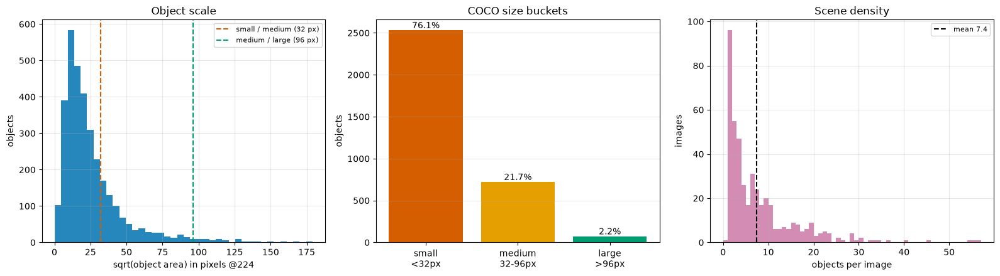

In [10]:
# --- 3.6 Object scale ---------------------------------------------------
box_stats = eda.box_statistics(DATA_DIR, cfg, split="train")

print(f"Boxes: {box_stats['n_boxes']}")
print(f"Objects per image: mean {box_stats['boxes_per_image']['mean']:.1f}, "
      f"median {box_stats['boxes_per_image']['median']:.0f}, "
      f"max {box_stats['boxes_per_image']['max']}")
print(f"Median object size @224: "
      f"{box_stats['width_px']['median']:.0f} x {box_stats['height_px']['median']:.0f} px")
print(f"\nCOCO size buckets:")
for bucket in ("small", "medium", "large"):
    print(f"  {bucket:<8}{box_stats['size_buckets'][bucket]:>6}  "
          f"({box_stats['size_buckets'][bucket + '_pct']:.1f}%)")

fig = viz.plot_box_size_distribution(box_stats, FIGURES_DIR / "eda_box_sizes.png")
plt.show()

**This is the single most important plot in the EDA.** Object scale predicts
detector behaviour better than any other dataset property. A dataset dominated
by small objects punishes architectures with coarse output resolution — which
is exactly what a grid detector has. The figure above is the reason the next
section measures grid resolution before choosing one.

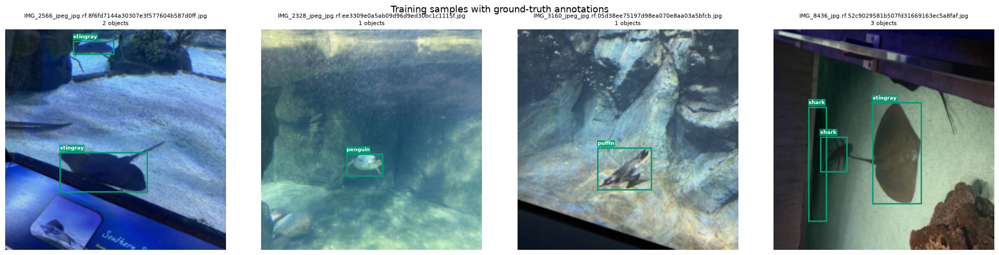

In [11]:
# --- 3.7 Representative samples with ground-truth boxes ----------------
from PIL import Image
from src.boxes import yolo_to_xyxy
from src.data import list_split_files, parse_yolo_label

rng = np.random.default_rng(cfg.seed)
files = list_split_files(DATA_DIR, "train")
picks = rng.choice(len(files), size=4, replace=False)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
for ax, i in zip(axes, picks):
    fname = files[i]
    img = Image.open(DATA_DIR / "train" / "images" / fname).convert("RGB")
    # BILINEAR to match src/data.py exactly - see note below
    img = img.resize((cfg.img_size, cfg.img_size), Image.BILINEAR)
    boxes_yolo, labels = parse_yolo_label(
        DATA_DIR / "train" / "labels" / (Path(fname).stem + ".txt")
    )
    boxes = yolo_to_xyxy(boxes_yolo, cfg.img_size, cfg.img_size)
    viz.draw_boxes(ax, np.asarray(img), boxes, labels, None, cfg.class_names,
                   color=viz.MODEL_COLORS["ground_truth"])
    ax.set_title(f"{fname}\n{len(boxes)} objects", fontsize=8)

fig.suptitle("Training samples with ground-truth annotations", fontsize=13)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "eda_samples.png", dpi=150, bbox_inches="tight", facecolor="white")
plt.show()

---
# 4. Choosing the Grid Resolution — A Measured Design Decision

A grid detector assigns each object to the cell containing its **centre**, and
each cell can represent **one** object. On a crowded dataset this puts a hard
ceiling on recall *before any training happens*: if two objects' centres land in
the same cell, one of them simply cannot be encoded, and no amount of training
will recover it.

Rather than picking $S$ by convention, we measure the ceiling directly.

grid      cells   objects    lost   lost %  max recall
------------------------------------------------------
S=7          49      3324     790    23.8%      76.2%
S=14        196      3324     230     6.9%      93.1%
S=28        784      3324      39     1.2%      98.8%


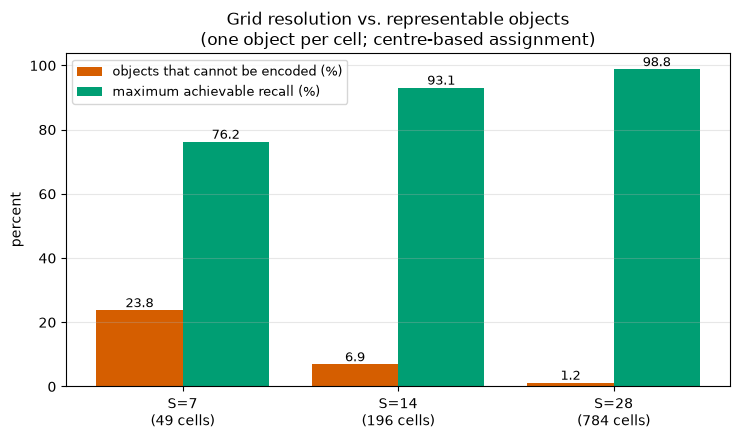

In [12]:
# --- Grid resolution vs. representable objects -------------------------
from src.data import grid_collision_report

collisions = grid_collision_report(DATA_DIR, "train", cfg, grid_sizes=(7, 14, 28))

print(f"{'grid':<8}{'cells':>7}{'objects':>10}{'lost':>8}{'lost %':>9}{'max recall':>12}")
print("-" * 54)
for S, row in sorted(collisions.items()):
    print(f"S={S:<6}{row['cells']:>7}{row['objects']:>10}{row['unrepresentable']:>8}"
          f"{row['loss_pct']:>8.1f}%{row['max_recall']:>11.1%}")

fig = viz.plot_grid_collision(collisions, FIGURES_DIR / "grid_resolution_analysis.png")
plt.show()

**The decision: $S = 14$.** The measured ceilings on the training split are:

| Grid | Cells | Objects lost | Maximum achievable recall |
|---|---|---|---|
| $S=7$ | 49 | **790 of 3324 (23.8%)** | 76.2% |
| $S=14$ | 196 | 230 (6.9%) | **93.1%** |
| $S=28$ | 784 | 39 (1.2%) | 98.8% |

- **$S=7$ is disqualified.** It throws away almost a quarter of the training
  signal, capping recall at 76% before a single weight is learned. A model built
  on it would look broken when in fact its *supervision* was broken — and that
  is a failure mode easily mistaken for "the architecture is bad".
- **$S=28$ recovers a further 5.7 points**, but each cell would then see an
  8×8-pixel footprint, too little context to classify an animal, and the output
  tensor quadruples.
- **$S=14$ falls out of the architecture for free**: four 2× poolings take
  224 → 14, so no resize is needed, each cell covers 16×16 px, and 93.1% of
  objects remain representable.

This is exactly the kind of decision the guide asks to see justified — and the
justification is a measurement, not a convention.

> **Worth stating in the discussion:** even at $S=14$, a perfect model could not
> exceed **93.1% recall** on this data. That ceiling is a property of the
> single-object-per-cell design, and it belongs in any honest reading of
> Model 1's results.

---
# 5. Preprocessing and Augmentation

### Shared preprocessing (identical for both models)

| Step | Setting | Why |
|---|---|---|
| Resize | 224×224 bilinear | Fixed tensor shape; small enough to train two detectors in a lab budget. Aspect ratio is **not** preserved — applied identically to both models, so it does not bias the comparison. |
| Scale | `ToTensor` → [0,1] | Standard float conversion. |
| Normalise | ImageNet mean/std | Applied **inside each model** (Model 1 via a registered buffer, Model 2 via torchvision's internal transform). Doing it in the dataset instead would normalise Model 2 twice and corrupt its pretrained features. |
| Label parsing | YOLO → xyxy pixels | Conversion happens *after* resize, so normalised coordinates map exactly onto the resized frame. |

### Augmentation (training split only)

Validation and test are never augmented — they must stay a fixed target, or the
metric becomes noisy and incomparable between epochs and between models.

Off-the-shelf `torchvision.transforms` cannot be used here: they transform the
image only, so any geometric operation silently invalidates the boxes. Every
geometric op in `BoxAwareAugment` applies the identical mapping to the
coordinates.

| Operation | Setting | Justification |
|---|---|---|
| Horizontal flip | p = 0.5 | Underwater scenes have no meaningful left/right orientation — a free doubling of the effective dataset. |
| Colour jitter | p = 0.5, ±25% brightness/contrast/saturation, ±0.03 hue | Water colour, turbidity and lighting are the dominant nuisance variables in this domain, and the real-world test images come from entirely different tanks. |
| Scale + translate | p = 0.5, scale 0.85–1.15, shift ±8% | Animals appear at many distances from the camera; this covers realistic framing variation. |

**Deliberately excluded:** vertical flips and large rotations (an upside-down
penguin is not a sample the deployed system will ever see, so training on one
spends capacity on an impossible case), and mosaic augmentation (it fabricates
object co-occurrences that do not exist in this domain).

Boxes pushed mostly out of frame by a geometric op are **dropped**, not clipped
and kept: a box whose object is 90% gone but whose label still claims a full
instance is a mislabelled training signal, not a hard example.

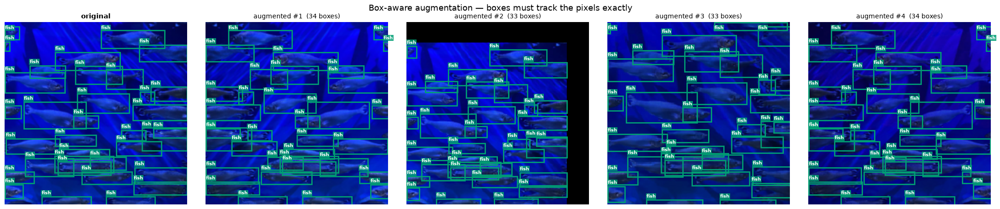

In [13]:
# --- Augmentation, verified visually -----------------------------------
from src.data import BoxAwareAugment

sample_file = list_split_files(DATA_DIR, "train")[0]
img = Image.open(DATA_DIR / "train" / "images" / sample_file).convert("RGB")
img = img.resize((cfg.img_size, cfg.img_size), Image.BILINEAR)
boxes_yolo, labels = parse_yolo_label(
    DATA_DIR / "train" / "labels" / (Path(sample_file).stem + ".txt")
)
boxes = yolo_to_xyxy(boxes_yolo, cfg.img_size, cfg.img_size)

augmenter = BoxAwareAugment(cfg, enabled=True)
np.random.seed(cfg.seed)

fig, axes = plt.subplots(1, 5, figsize=(22, 4.6))
viz.draw_boxes(axes[0], np.asarray(img), boxes, labels, None, cfg.class_names,
               color=viz.MODEL_COLORS["ground_truth"])
axes[0].set_title("original", fontsize=11, weight="bold")

for k in range(1, 5):
    aug_img, aug_boxes, aug_labels = augmenter(img, boxes.copy(), labels.copy())
    viz.draw_boxes(axes[k], np.asarray(aug_img), aug_boxes, aug_labels, None,
                   cfg.class_names, color=viz.MODEL_COLORS["ground_truth"])
    axes[k].set_title(f"augmented #{k}  ({len(aug_boxes)} boxes)", fontsize=10)

fig.suptitle("Box-aware augmentation — boxes must track the pixels exactly",
             fontsize=13)
fig.tight_layout()
fig.savefig(FIGURES_DIR / "augmentation_examples.png", dpi=150,
            bbox_inches="tight", facecolor="white")
plt.show()

The boxes above track the transformed pixels, which is the whole point — and it
is checked automatically, not just by eye:
`tests/test_core.py::TestAugmentation` asserts that a horizontal flip maps
$x_1 \mapsto W - x_2$ exactly, that flipping twice is the identity, and that no
scale/translate draw can ever produce a box outside the frame.

---
# 6. Data Splitting and Leakage Control

The split published with the dataset is used as-is: **448 / 127 / 63**
(70 / 20 / 10).

**Why these ratios.** With only 638 images, the training split has to stay large
or the from-scratch model has nothing to learn from. 127 validation images is
the smallest set that still gives a usable mAP signal for early stopping and
threshold selection — below ~100 the metric jitters enough to stop training on
noise. The 63-image test split is small, and this is stated as a limitation: it
makes the test estimate noisy, which is precisely why the evaluation reports
per-class support alongside every AP.

**Why not re-split.** Re-shuffling would give more test data but destroy
comparability with any other work on this public dataset, and would risk
splitting near-duplicate frames across the boundary.

### Leakage controls, in order of strength

1. **Filename disjointness** — the cheap check (section 6.1).
2. **Content-hash disjointness** — catches the same photo saved under two names
   (already run in section 3.4).
3. **No test data in any decision** — the confidence threshold is chosen on
   validation (section 9.1) and frozen before the test split is touched. Model
   checkpoints are selected on validation mAP. The test split is read exactly
   once, at the end.

In [14]:
# --- Leakage check: filename disjointness ------------------------------
leak = eda.leakage_report(DATA_DIR)

print("Split sizes:", leak["sizes"])
print("\nPairwise filename overlaps:")
for pair, count in leak["overlaps"].items():
    status = "OK" if count == 0 else "LEAK"
    print(f"  {pair:<16}{count:>5}   [{status}]")

assert leak["clean"], f"Leakage detected: {leak['overlap_files']}"
print("\nEvery image belongs to exactly one split.")

Split sizes: {'train': 448, 'valid': 127, 'test': 63}

Pairwise filename overlaps:
  train|valid         0   [OK]
  train|test          0   [OK]
  valid|test          0   [OK]

Every image belongs to exactly one split.


---
# 7. Model Architectures

## 7.1 Model 1 — From-Scratch Grid Detector

### The mathematical idea

The image is divided into an $S \times S$ grid ($S=14$). Each cell predicts one
detection vector:

$$\mathbf{y}_{ij} = [\, p_c,\; t_x,\; t_y,\; w,\; h,\; c_1, \dots, c_7 \,] \in \mathbb{R}^{12}$$

- $p_c$ — **objectness**: probability that an object's centre lies in this cell
- $t_x, t_y \in [0,1]$ — the centre's offset *within* the cell
- $w, h \in [0,1]$ — box size as a fraction of the whole image
- $c_1 \dots c_7$ — class scores

A cell owns an object when the object's **centre** falls inside it. Absolute
position is recovered from the cell index plus the offset:

$$x_{\text{centre}} = \frac{j + t_x}{S}, \qquad y_{\text{centre}} = \frac{i + t_y}{S}$$

Predicting an offset *relative to the cell* rather than an absolute coordinate
is what makes the problem learnable: every cell solves the same small,
translation-invariant regression, so a single shared 1×1 convolution can serve
all 196 of them.

### Architecture and data flow

| Stage | Operation | Output |
|---|---|---|
| input | — | 3 × 224 × 224 |
| 1 | 2 × (Conv3×3 → BN → ReLU), MaxPool2 | 32 × 112 × 112 |
| 2 | 2 × (Conv3×3 → BN → ReLU), MaxPool2 | 64 × 56 × 56 |
| 3 | 2 × (Conv3×3 → BN → ReLU), MaxPool2 | 128 × 28 × 28 |
| 4 | 2 × (Conv3×3 → BN → ReLU), MaxPool2 | 256 × 14 × 14 |
| 5 | 2 × (Conv3×3 → BN → ReLU) | 512 × 14 × 14 |
| head | Dropout2d(0.1), Conv 1×1 | 12 × 14 × 14 → permuted to 14 × 14 × 12 |

The grid size is not a hyperparameter bolted on at the end — four 2× poolings
take 224 down to 14, so $S=14$ **falls out of the architecture**.

**Why a 1×1 convolution head** rather than YOLOv1's flatten-then-dense layer:
it keeps the network fully convolutional, so the same 12-output predictor is
applied at every cell with shared weights. This cuts the parameter count by an
order of magnitude and means a cell's prediction depends only on its receptive
field, not on where it sits in a flattened vector.

**Activations.** The network emits **raw logits**. Sigmoid is applied to
$p_c$, $t_x$, $t_y$, $w$, $h$ (all must lie in $[0,1]$) and softmax to the class
scores — but only inside the loss (via numerically stable `*_with_logits`
forms) and inside the decoder. Keeping activations out of `forward` is what lets
training use `BCEWithLogitsLoss`, which applies the log-sum-exp trick internally
instead of computing `log(sigmoid(x))` and returning NaN once the model becomes
confident.

**Objectness prior.** The head's objectness bias is initialised to $-4$
($\sigma(-4) \approx 0.018$). With 196 cells and ~25 objects, roughly 87% of
cells are background; starting from "assume empty" prevents an initial flood of
false positives whose gradients would otherwise dominate the first epochs.

### Backpropagation

Training updates every weight by the chain rule,

$$\frac{\partial L}{\partial W} = \frac{\partial L}{\partial A}\cdot\frac{\partial A}{\partial Z}\cdot\frac{\partial Z}{\partial W}$$

with $\sigma'(x) = \sigma(x)(1-\sigma(x))$ for the sigmoid units. Autograd
applies this automatically through every convolution, normalisation and
activation, from the loss back to the first layer.

### Strengths and limitations

| Strengths | Limitations |
|---|---|
| One forward pass per image — no proposal stage | **One object per cell**: objects sharing a cell cannot both be encoded (measured in section 4) |
| ~9× fewer parameters than Model 2 | No anchors — a single box shape per cell must fit every aspect ratio |
| Every component implemented and inspectable | Coarse 14×14 output limits localisation precision on small objects |
| Fully convolutional; input size is flexible | Trained from scratch on 448 images — data-starved by construction |

In [15]:
# --- Model 1 ------------------------------------------------------------
from src.models import ScratchGridDetector
from src.losses import GridDetectionLoss

model1 = ScratchGridDetector(num_classes=cfg.num_classes, grid_size=cfg.grid_size)

print(model1)
print(f"\nParameters : {count_parameters(model1):,}")
print(f"Model size : {model_size_mb(model1):.1f} MB")

# Shape check: the grid must match what encode_grid_targets produces.
with torch.no_grad():
    dummy = model1(torch.rand(2, 3, cfg.img_size, cfg.img_size))
print(f"Output     : {tuple(dummy.shape)}  == (batch, S, S, 5+C)")
assert dummy.shape == (2, cfg.grid_size, cfg.grid_size, 5 + cfg.num_classes)

ScratchGridDetector(
  (stage1): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (stage2): Sequential(
    (0): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bi

### The multi-task loss

Detection is three problems at once — *is anything here*, *where exactly*, and
*what is it* — so the loss is a weighted sum of three objectives computed over
different subsets of the grid:

$$L = \lambda_{\text{coord}} L_{\text{loc}} + \lambda_{\text{obj}} L_{\text{obj}} + \lambda_{\text{noobj}} L_{\text{noobj}} + \lambda_{\text{cls}} L_{\text{cls}}$$

with $\lambda_{\text{coord}}=5$, $\lambda_{\text{obj}}=1$,
$\lambda_{\text{noobj}}=0.5$, $\lambda_{\text{cls}}=1$.

| Term | Formulation | Applied to |
|---|---|---|
| $L_{\text{loc}}$ | Smooth-L1 on $(t_x, t_y)$ and on $(\sqrt{w}, \sqrt{h})$ | object cells only |
| $L_{\text{obj}}$ | BCE-with-logits on $p_c$ | object cells only |
| $L_{\text{noobj}}$ | BCE-with-logits on $p_c$ | background cells only |
| $L_{\text{cls}}$ | cross-entropy | object cells only |

**Why localisation and classification skip background cells.** A cell with no
object has no meaningful box to regress and no class to name; including it would
train the network towards an arbitrary target.

**Why $\sqrt{w}, \sqrt{h}$ and not $w, h$.** A 10-pixel error on a 20-pixel
starfish matters far more than the same error on a 200-pixel shark, but an L1
loss on raw width treats them identically. The square root compresses the large
end and expands the small end, so small objects — most of this dataset — receive
a proportionate share of the gradient.

**Why $\lambda_{\text{noobj}} = 0.5$.** With 196 cells and 7.4 objects per image
on average, **~96% of cells are background**. Weighting every cell equally lets
the background term dominate the gradient and drives the model to the trivial
"predict nothing anywhere" solution — which scores well on loss and detects
nothing. The objectness terms are also normalised by their own cell counts
($n_{\text{obj}}$ and $n_{\text{noobj}}$ separately), so the balance between
them is set by the lambdas alone and does not drift with scene density.

---
## 7.2 Model 2 — Faster R-CNN with Transfer Learning

### The mathematical idea

Faster R-CNN is a **two-stage** detector, structurally the opposite of Model 1:

1. A **backbone** (ResNet-50 + Feature Pyramid Network) extracts features at
   several scales. The FPN is what makes small objects tractable — it fuses
   high-resolution early features with semantically rich deep ones, so a small
   fish is detected on a fine feature map rather than an 8×-downsampled one.
2. A **Region Proposal Network** slides over those features and, from a dense
   set of anchors of several scales and aspect ratios, emits a few hundred
   class-agnostic candidate regions with objectness scores.
3. **ROI heads** crop each proposal (`RoIAlign`), then classify it and refine
   its box coordinates.

The loss is the sum of four terms — RPN objectness, RPN box regression, ROI
classification, ROI box regression — computed and balanced internally by
torchvision.

**Why this is fundamentally different from Model 1.** Model 1 makes 196 dense
predictions in a fixed geometry, one per cell, regardless of image content.
Faster R-CNN spends computation adaptively: it first decides *where to look*,
then looks carefully. That buys accuracy — especially on small and overlapping
objects, since proposals are not tied to a fixed grid — and costs latency,
because the second stage runs once per proposal.

### The adaptation performed

The guide requires pretrained weights to be *meaningfully adapted*, not merely
executed. Three concrete changes:

1. **The box predictor is replaced.** COCO's 91-class head is discarded and a
   fresh `FastRCNNPredictor` sized for 7 classes + background is initialised
   randomly. None of COCO's class semantics survive.
2. **Partial backbone freezing.** Only the top 3 ResNet stages are trainable.
   The early layers encode edges and textures that transfer as-is; with 448
   training images, fine-tuning all of them overfits quickly and destroys the
   pretrained features.
3. **The internal transform is pinned to 224×224.** Left at its defaults,
   torchvision resizes to an 800-pixel minimum side — the comparison would then
   be 224px against 800px, and both the accuracy and the latency gap would
   mostly be measuring *that*, not the architectures. It is also given the same
   ImageNet normalisation constants Model 1 uses internally.

### Strengths and limitations

| Strengths | Limitations |
|---|---|
| COCO pretraining supplies features 448 images could never teach | ~41M parameters, ~165 MB on disk |
| Two-stage refinement localises precisely | Two-stage inference is far slower |
| FPN handles the wide scale range this dataset has | Little of it is "ours" — the technical contribution is the adaptation, not the architecture |
| Anchors cover many aspect ratios | Many internal hyperparameters left at library defaults |

In [16]:
# --- Model 2 ------------------------------------------------------------
from src.models import build_faster_rcnn

model2 = build_faster_rcnn(
    num_classes=cfg.num_classes,
    img_size=cfg.img_size,
    trainable_backbone_layers=cfg.m2_trainable_backbone_layers,
)

total = count_parameters(model2)
trainable = count_parameters(model2, trainable_only=True)

print(f"Parameters : {total:,} total")
print(f"             {trainable:,} trainable ({100*trainable/total:.1f}%)")
print(f"             {total - trainable:,} frozen (early backbone stages)")
print(f"Model size : {model_size_mb(model2):.1f} MB")
print(f"\nBox predictor (replaced, randomly initialised):")
print(f"  {model2.roi_heads.box_predictor}")
print(f"\nParameter ratio Model 2 : Model 1 = "
      f"{total / count_parameters(model1):.1f} : 1")

Parameters : 41,329,911 total
             41,107,511 trainable (99.5%)
             222,400 frozen (early backbone stages)
Model size : 158.1 MB

Box predictor (replaced, randomly initialised):
  FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=8, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=32, bias=True)
)

Parameter ratio Model 2 : Model 1 = 8.8 : 1


---
# 8. Training

Both models are trained under the **same policy**: same early-stopping rule
(patience 12 on validation mAP@0.5), same checkpoint-selection criterion, same
seeding, same augmentation.

**Checkpoints are selected on validation mAP@0.5, not validation loss.** The two
losses are not comparable — one is a weighted multi-task sum over a grid, the
other a sum of RPN and ROI terms — and loss is in any case a proxy. Selecting on
the metric actually reported also avoids the common failure where a model starts
overfitting at epoch 5 but the weights saved are from epoch 20.

### Conditions that could not be kept identical

| Condition | Model 1 | Model 2 | Why |
|---|---|---|---|
| Optimiser | Adam, 1e-3 | SGD + momentum, 5e-3 | Adam converges faster from random init; SGD is the reference recipe for fine-tuning pretrained detection backbones and disturbs them less. |
| Schedule | cosine annealing | StepLR ×0.5 / 5 epochs | Matched to each optimiser's convention. |
| Batch size | 16 | 8 | Faster R-CNN's activations are much larger; 8 is the largest batch fitting a 16 GB T4 at 224px. |
| Max epochs | 80 | 20 | A model trained from scratch needs more passes than one starting from COCO features. Both use the *same* early-stopping rule, so neither is cut off while still improving. |
| Initialisation | random (He) | COCO-pretrained | This difference **is** the experiment. |

Everything else is shared verbatim: dataset, splits, resize, augmentation
policy, normalisation constants, NMS implementation and IoU, evaluation code,
threshold-selection procedure and timing protocol.

> **Set `RETRAIN = False` to load the supplied checkpoints.** Full retraining is
> not required to reproduce anything below it.

In [17]:
# --- Train, or load the supplied checkpoints ---------------------------
from src.engine import load_checkpoint, train_model

RETRAIN = False          # <-- set True to train from scratch

CKPT = {
    "scratch":    CHECKPOINT_DIR / "scratch_best.pt",
    "fasterrcnn": CHECKPOINT_DIR / "fasterrcnn_best.pt",
}

summaries = {}
for kind, path in CKPT.items():
    if RETRAIN or not path.exists():
        set_seed(cfg.seed, cfg.deterministic)   # independent, reproducible runs
        print(f"\n=== training {kind} " + "=" * (50 - len(kind)))
        summaries[kind] = train_model(kind, DATA_DIR, cfg, DEVICE, path)
        save_json(summaries[kind], RESULTS_DIR / f"{kind}_training.json")
    else:
        _, _, ckpt = load_checkpoint(path, DEVICE)
        summaries[kind] = {
            "history": ckpt.get("history", []),
            "best": ckpt.get("metrics", {}),
            "train_seconds": float("nan"),
            "epochs_run": len(ckpt.get("history", [])),
        }
        print(f"loaded {kind}: best epoch {ckpt.get('epoch')}, "
              f"val mAP@0.5 {ckpt.get('metrics', {}).get('val_map50', float('nan')):.4f}")

loaded scratch: best epoch 72, val mAP@0.5 0.1836


loaded fasterrcnn: best epoch 20, val mAP@0.5 0.5472


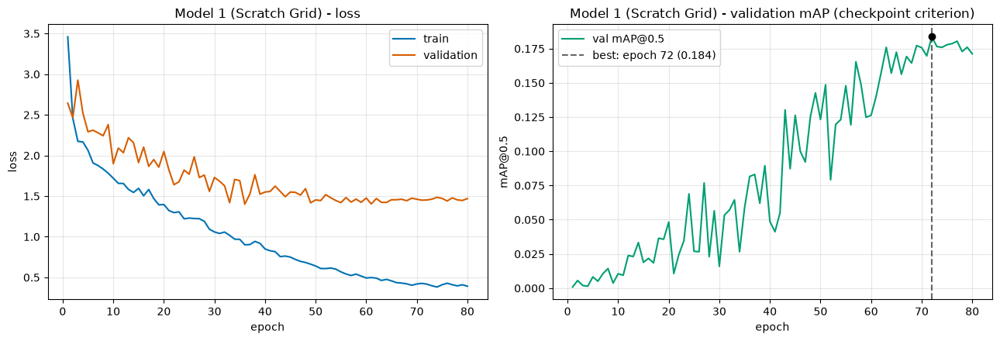

Model 1 (Scratch Grid): 80 epochs run, best epoch 72 (val mAP@0.5 0.1836, val loss 1.4523)
  -> validation peaked 8 epochs before the run ended; the saved weights are from the peak, not the last epoch.


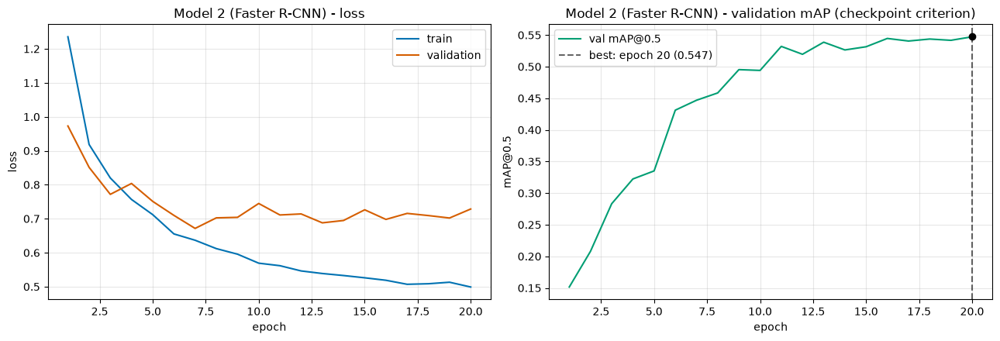

Model 2 (Faster R-CNN): 20 epochs run, best epoch 20 (val mAP@0.5 0.5472, val loss 0.7285)


In [18]:
# --- Training curves ----------------------------------------------------
LABELS = {"scratch": "Model 1 (Scratch Grid)", "fasterrcnn": "Model 2 (Faster R-CNN)"}

for kind, summary in summaries.items():
    history = summary["history"]
    if not history:
        print(f"no history for {kind}")
        continue
    fig = viz.plot_training_curves(history, LABELS[kind],
                                   FIGURES_DIR / f"{kind}_training_curves.png")
    plt.show()

    best = max(history, key=lambda h: h["val_map50"])
    print(f"{LABELS[kind]}: {len(history)} epochs run, best epoch {best['epoch']} "
          f"(val mAP@0.5 {best['val_map50']:.4f}, val loss {best['val_loss']:.4f})")
    if best["epoch"] < len(history):
        print(f"  -> validation peaked {len(history) - best['epoch']} epochs before the "
              f"run ended; the saved weights are from the peak, not the last epoch.")

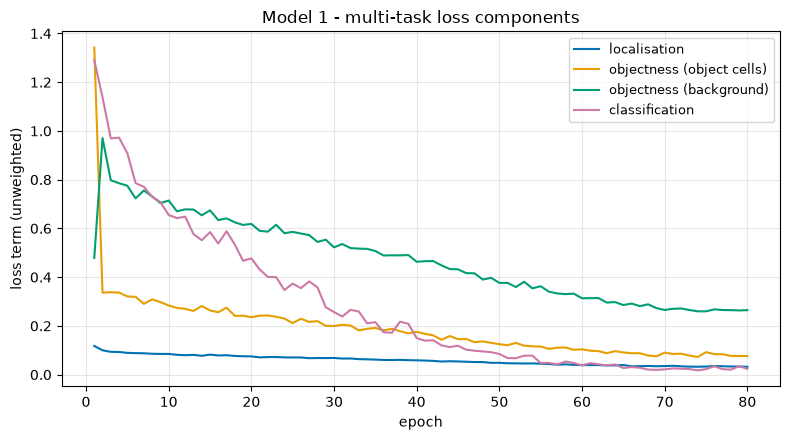

In [19]:
# --- Model 1 loss components -------------------------------------------
if summaries["scratch"]["history"]:
    fig = viz.plot_loss_components(summaries["scratch"]["history"],
                                    FIGURES_DIR / "scratch_loss_components.png")
    if fig:
        plt.show()

The component plot answers a question the total loss cannot: **which objective
is actually driving training.** The classic grid-detector pathology is that the
background objectness term dominates while localisation flatlines — the model
gets very good at saying "nothing here" and never learns to place a box. If
`noobj` collapses quickly while `loc` stays flat, that is what is happening, and
$\lambda_{\text{noobj}}$ is the knob.

---
# 9. Evaluation

Both models are evaluated on the **same unseen test split**, through the **same
code path**, with the **same post-processing**.

### Metrics and what each reveals

| Metric | What it tells you |
|---|---|
| **mAP@0.5** | Overall quality, averaged over classes so a rare class cannot be hidden. Threshold-free. |
| **mAP@[.5:.95]** | Averaged over IoU 0.50–0.95. Rewards *precise* boxes, not just roughly-right ones — the gap against mAP@0.5 is a direct read on localisation quality. |
| **Per-class AP** | Which species work and which do not. |
| **Precision** | Of the boxes produced, how many were real. Low precision = the output is noisy to review. |
| **Recall** | Of the real objects, how many were found. Low recall = the system misses things silently. |
| **F1** | Single operating-point summary, balancing the two. |
| **Confusion matrix** | *Which* classes get mistaken for which, plus explicit background rows/columns for false positives and misses. |
| **Latency / FPS** | Deployment cost. |

**No single score is relied on** — the guide asks for this explicitly, and here
it matters: a model can post a respectable mAP while being unusable at any
threshold a human would pick.

### Three methodological guarantees

1. **mAP is a mean of per-class APs**, each computed by all-point interpolation
   over a precision envelope. It is *not* one pooled curve over all classes —
   that quantity is not mAP and flatters whichever model does well on the
   majority class.
2. **One matching pass feeds everything.** PR curve, AP, and the
   precision/recall counts all come from the same greedy assignment in which
   each ground-truth box is claimed at most once. Using a looser rule for the
   curve — e.g. `any(iou(pred, gt) >= 0.5)` — lets two boxes on one object both
   count as true positives and pushes recall above 1.0.
3. **The operating threshold is chosen on validation, then frozen.** Tuning it
   on test would make the reported numbers the best of many peeks at data that
   is supposed to be untouched.

Model 1 (Scratch Grid)     threshold = 0.90  (max validation F1)


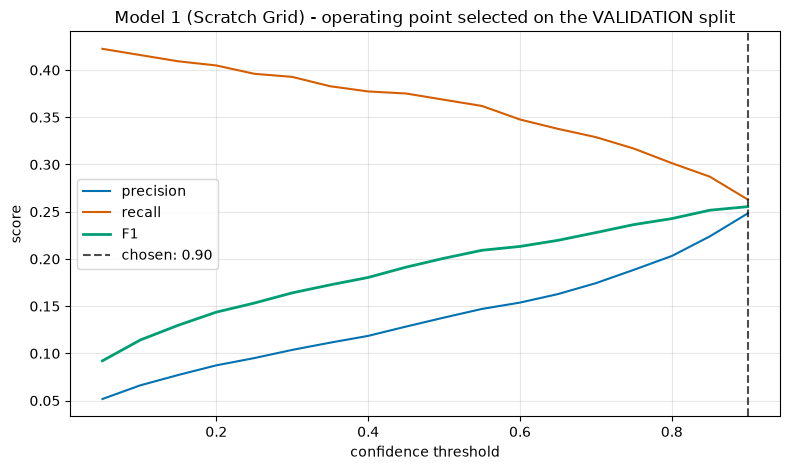

Model 2 (Faster R-CNN)     threshold = 0.65  (max validation F1)


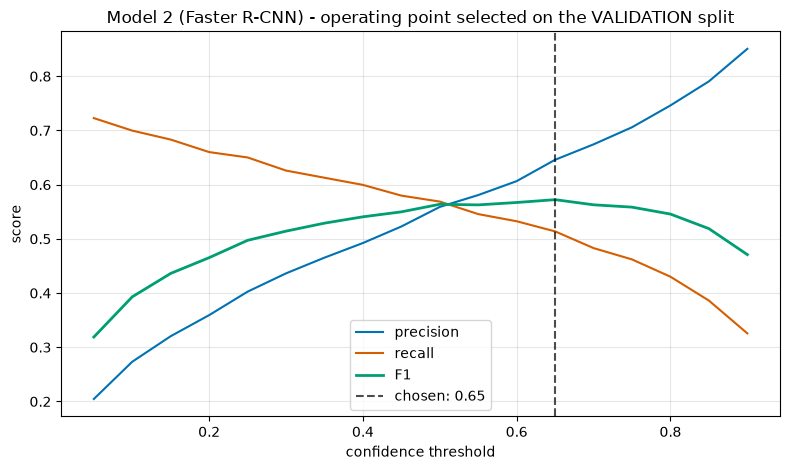

In [20]:
# --- 9.1 Choose each model's operating point on VALIDATION -------------
from src.data import DetectionDataset, GridDataset, load_ground_truth
from src.engine import benchmark_latency, predict_split
from src.metrics import evaluate_detections, select_confidence_threshold

def make_dataset(kind, split):
    ds_cls = GridDataset if kind == "scratch" else DetectionDataset
    return ds_cls(DATA_DIR, split, cfg, augment=False)

gt_valid = load_ground_truth(DATA_DIR, "valid", cfg)
gt_test = load_ground_truth(DATA_DIR, "test", cfg)

models, thresholds, sweeps = {}, {}, {}

for kind in ("scratch", "fasterrcnn"):
    model, model_cfg, ckpt = load_checkpoint(CKPT[kind], DEVICE)
    models[kind] = (model, model_cfg)

    valid_preds = predict_split(model, kind, make_dataset(kind, "valid"), model_cfg, DEVICE)
    best_thr, sweep = select_confidence_threshold(
        valid_preds, gt_valid, model_cfg.class_names, model_cfg.eval_iou_threshold
    )
    thresholds[kind], sweeps[kind] = best_thr, sweep
    model_cfg.conf_threshold = best_thr

    print(f"{LABELS[kind]:<26} threshold = {best_thr:.2f}  (max validation F1)")
    fig = viz.plot_threshold_sweep(sweep, best_thr, LABELS[kind],
                                    FIGURES_DIR / f"{kind}_threshold_sweep.png")
    plt.show()

In [21]:
# --- 9.2 Evaluate on the TEST split ------------------------------------
results, predictions, latencies = {}, {}, {}

for kind in ("scratch", "fasterrcnn"):
    model, model_cfg = models[kind]
    test_ds = make_dataset(kind, "test")

    preds = predict_split(model, kind, test_ds, model_cfg, DEVICE)
    predictions[kind] = preds

    result = evaluate_detections(
        preds, gt_test, model_cfg.class_names,
        iou_threshold=model_cfg.eval_iou_threshold,
        conf_threshold=thresholds[kind],
    )
    results[LABELS[kind]] = result
    latencies[kind] = benchmark_latency(model, kind, test_ds, model_cfg, DEVICE)

    print(f"\n{LABELS[kind]}")
    print(f"  mAP@0.5      {result.map_50:.4f}")
    print(f"  mAP@.5:.95   {result.map_50_95:.4f}")
    print(f"  precision    {result.precision:.4f}")
    print(f"  recall       {result.recall:.4f}")
    print(f"  F1           {result.f1:.4f}")
    print(f"  TP/FP/FN     {result.tp} / {result.fp} / {result.fn}")
    print(f"  latency      {latencies[kind]['median_ms']:.1f} ms median, "
          f"{latencies[kind]['p95_ms']:.1f} ms p95, {latencies[kind]['fps']:.1f} FPS")


Model 1 (Scratch Grid)
  mAP@0.5      0.2718
  mAP@.5:.95   0.0821
  precision    0.2730
  recall       0.2791
  F1           0.2760
  TP/FP/FN     163 / 434 / 421
  latency      36.4 ms median, 40.5 ms p95, 27.4 FPS



Model 2 (Faster R-CNN)
  mAP@0.5      0.5363
  mAP@.5:.95   0.2630
  precision    0.6682
  recall       0.5034
  F1           0.5742
  TP/FP/FN     294 / 146 / 290
  latency      434.8 ms median, 479.1 ms p95, 2.3 FPS


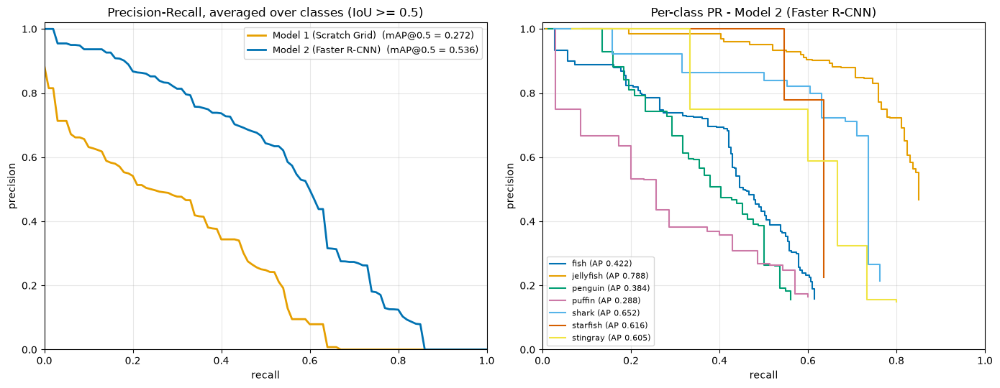

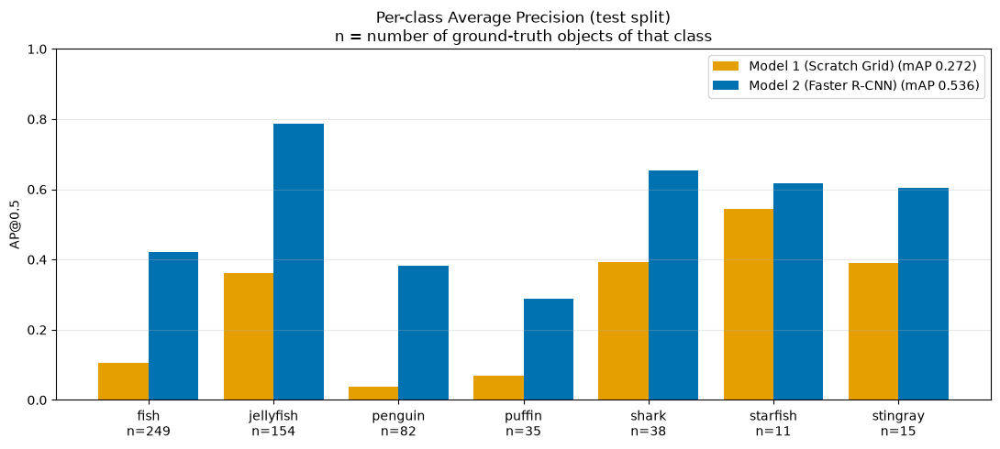

class         objects      Model 1 (Scratch Grid)      Model 2 (Faster R-CNN)
-----------------------------------------------------------------------------
fish              249    AP 0.105  P 0.17  R 0.22    AP 0.422  P 0.56  R 0.44
jellyfish         154    AP 0.361  P 0.51  R 0.40    AP 0.788  P 0.88  R 0.70
penguin            82    AP 0.038  P 0.17  R 0.16    AP 0.384  P 0.56  R 0.35
puffin             35    AP 0.070  P 0.17  R 0.14    AP 0.288  P 0.43  R 0.26
shark              38    AP 0.392  P 0.68  R 0.45    AP 0.652  P 0.77  R 0.63
starfish           11    AP 0.545  P 0.62  R 0.45    AP 0.616  P 0.86  R 0.55
stingray           15    AP 0.391  P 0.83  R 0.33    AP 0.605  P 0.69  R 0.60


In [22]:
# --- 9.3 Precision-Recall curves and per-class AP ----------------------
fig = viz.plot_pr_curves(results, FIGURES_DIR / "pr_curves.png")
plt.show()

fig = viz.plot_per_class_ap(results, FIGURES_DIR / "per_class_ap.png")
plt.show()

print(f"{'class':<12}{'objects':>9}", end="")
for name in results:
    print(f"{name:>28}", end="")
print()
print("-" * (21 + 28 * len(results)))
for cls in cfg.class_names:
    support = next(iter(results.values())).per_class[cls]["n_gt"]
    print(f"{cls:<12}{support:>9}", end="")
    for name, res in results.items():
        ap = res.per_class[cls]["ap"]
        r = res.per_class[cls]
        cell = "n/a" if ap != ap else f"AP {ap:.3f}  P {r['precision']:.2f}  R {r['recall']:.2f}"
        print(f"{cell:>28}", end="")
    print()

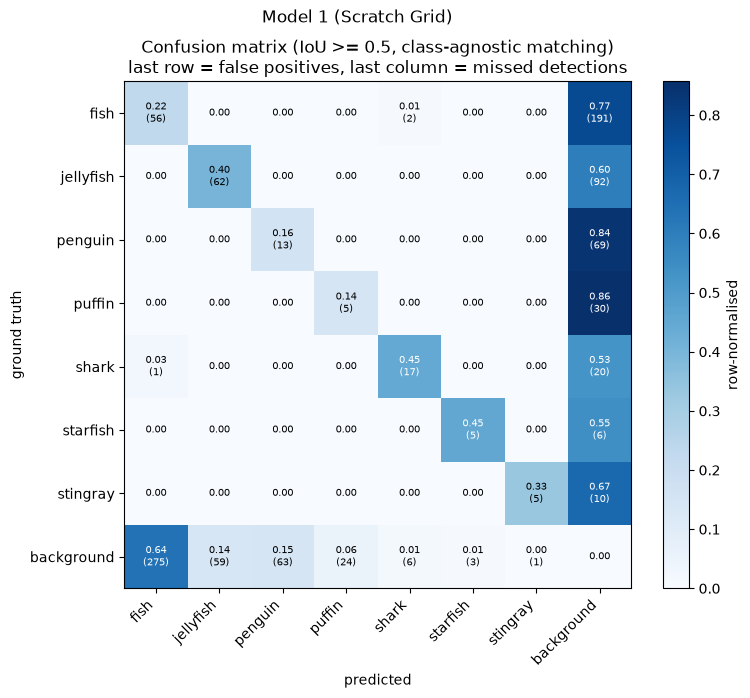

Model 1 (Scratch Grid): 418 missed objects, 431 background false positives, 3 class confusions


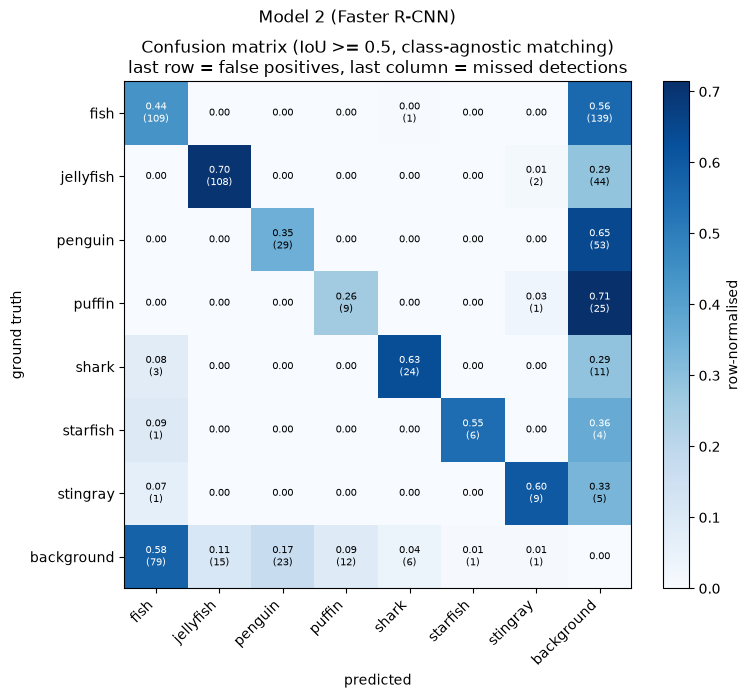

Model 2 (Faster R-CNN): 281 missed objects, 137 background false positives, 9 class confusions


In [23]:
# --- 9.4 Confusion matrices --------------------------------------------
for kind in ("scratch", "fasterrcnn"):
    result = results[LABELS[kind]]
    fig = viz.plot_confusion_matrix(
        result, FIGURES_DIR / f"{kind}_confusion_matrix.png"
    )
    fig.suptitle(LABELS[kind], y=1.02, fontsize=12)
    plt.show()

    # The background column and row are the interesting ones: they separate
    # "found the object but named it wrong" from "did not find it at all".
    cm = result.confusion_matrix
    n = len(result.class_names)
    print(f"{LABELS[kind]}: {int(cm[:n, n].sum())} missed objects, "
          f"{int(cm[n, :n].sum())} background false positives, "
          f"{int(cm[:n, :n].sum() - np.trace(cm[:n, :n]))} class confusions")

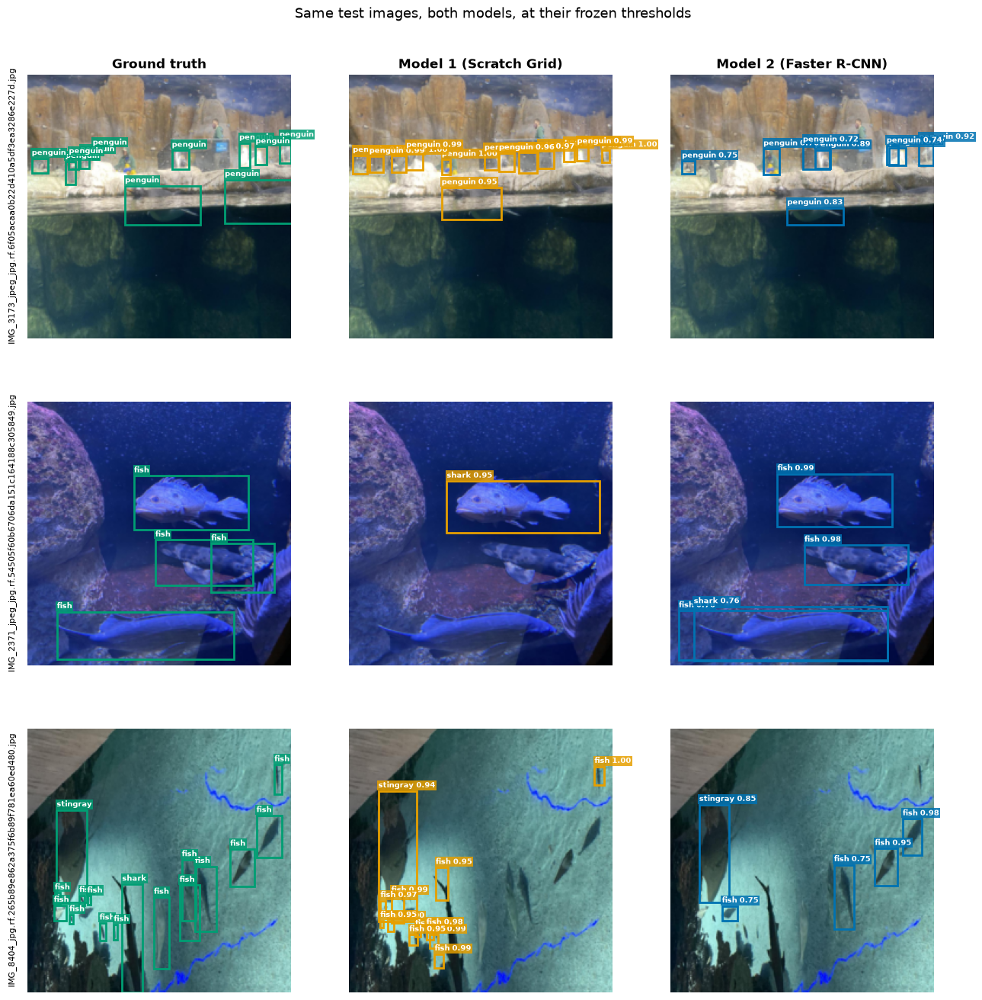

In [24]:
# --- 9.5 Qualitative comparison on the same test images ---------------
rng = np.random.default_rng(cfg.seed)
sample_idx = rng.choice(len(gt_test), size=3, replace=False)

samples = []
for i in sample_idx:
    image, _, meta = make_dataset("fasterrcnn", "test")[int(i)]
    display = image.permute(1, 2, 0).numpy()
    gt = gt_test[int(i)]

    def keep(kind):
        p = predictions[kind][int(i)].filter_by_score(thresholds[kind])
        return p.boxes, p.scores, p.labels

    samples.append({
        "image": display,
        "name": meta["file"],
        "gt": (gt.boxes, gt.labels),
        "pred1": keep("scratch"),
        "pred2": keep("fasterrcnn"),
    })

fig = viz.plot_qualitative_comparison(
    samples, cfg.class_names, FIGURES_DIR / "qualitative_comparison.png",
    title="Same test images, both models, at their frozen thresholds",
)
plt.show()

---
# 10. Failure Analysis

Eyeballing a few pictures and asserting a cause is not evidence. Every
prediction and every missed object is assigned to one of six mutually exclusive
outcomes, then aggregated — so the write-up says *what kind* of mistake each
model makes and *how often*.

| Outcome | Definition | What it points at |
|---|---|---|
| `true_positive` | right class, IoU ≥ 0.5 against an unclaimed object | — |
| `duplicate_detection` | right class and IoU ≥ 0.5, but that object was already claimed | NMS threshold too high for crowded scenes |
| `wrong_class` | localised an object well but named it something else | classifier head; visually similar classes |
| `poor_localization` | right class, best IoU in [0.1, 0.5) | box regression; output resolution |
| `background_false_positive` | best IoU below 0.1 against anything | threshold too permissive; background texture |
| `missed_detection` | a ground-truth object nothing landed on | object scale, occlusion, class imbalance |

The distinction matters because the fixes are different. A model losing recall
to `missed_detection` on small objects needs more output resolution; one losing
precision to `wrong_class` needs a better classifier or more data for the
confused pair. Collapsing both into "errors" hides which.

In [25]:
# --- 10.1 Error taxonomy -----------------------------------------------
from src.failure_analysis import (
    analyse_failures, failure_markdown_table, failure_summary_text, rank_worst_images,
)

analyses = {}
for kind in ("scratch", "fasterrcnn"):
    analyses[LABELS[kind]] = analyse_failures(
        predictions[kind], gt_test, cfg.class_names,
        iou_threshold=cfg.eval_iou_threshold, conf_threshold=thresholds[kind],
    )

for name, analysis in analyses.items():
    print(f"\n{name}")
    print(f"  {'outcome':<28}{'count':>8}{'share of errors':>18}")
    print("  " + "-" * 54)
    for kind_name, count in analysis["counts"].items():
        share = analysis["error_share"].get(kind_name)
        share_str = f"{share:.1%}" if share is not None else "  (correct)"
        print(f"  {kind_name:<28}{count:>8}{share_str:>18}")


Model 1 (Scratch Grid)
  outcome                        count   share of errors
  ------------------------------------------------------
  true_positive                    163         (correct)
  duplicate_detection                4              0.5%
  wrong_class                        3              0.4%
  poor_localization                240             28.1%
  background_false_positive        187             21.9%
  missed_detection                 421             49.2%

Model 2 (Faster R-CNN)
  outcome                        count   share of errors
  ------------------------------------------------------
  true_positive                    294         (correct)
  duplicate_detection                3              0.7%
  wrong_class                       10              2.3%
  poor_localization                 63             14.4%
  background_false_positive         70             16.1%
  missed_detection                 290             66.5%


In [26]:
# --- 10.2 Miss rate by object size -------------------------------------
print(f"{'model':<28}{'small':>10}{'medium':>10}{'large':>10}")
print("-" * 58)
for name, analysis in analyses.items():
    rates = analysis["miss_rate_by_bucket"]
    print(f"{name:<28}", end="")
    for bucket in ("small", "medium", "large"):
        print(f"{rates.get(bucket, 0):>9.1%}", end=" ")
    print()

print("\nGround-truth objects per bucket:",
      next(iter(analyses.values()))["gt_by_bucket"])

print("\nMost frequent class confusions (well-localised but mislabelled):")
for name, analysis in analyses.items():
    confusions = analysis["top_confusions"]
    pretty = ", ".join(f"{a}->{b} ({n})" for (a, b), n in confusions[:5]) or "none"
    print(f"  {name}: {pretty}")

model                            small    medium     large
----------------------------------------------------------
Model 1 (Scratch Grid)          76.8%     51.7%    100.0% 
Model 2 (Faster R-CNN)          56.3%     24.1%     33.3% 

Ground-truth objects per bucket: {'medium': 116, 'small': 462, 'large': 6}

Most frequent class confusions (well-localised but mislabelled):
  Model 1 (Scratch Grid): fish->shark (2), shark->fish (1)
  Model 2 (Faster R-CNN): shark->fish (3), fish->shark (2), jellyfish->stingray (2), puffin->stingray (1), starfish->fish (1)


In [27]:
# --- 10.3 Generated failure write-up -----------------------------------
from IPython.display import Markdown, display

table = failure_markdown_table(analyses, cfg.class_names)
display(Markdown(table))

print()
for name, analysis in analyses.items():
    print("-", failure_summary_text(name, analysis), "\n")

(RESULTS_DIR / "failure_analysis.md").write_text(table, encoding="utf-8")

#### Error composition

| Failure type | Model 1 (Scratch Grid) (count / share) | Model 2 (Faster R-CNN) (count / share) | Likely cause |
|---|---|---|---|
| `duplicate_detection` | 4 / 0% | 3 / 1% | two boxes survived NMS for one object - suppression IoU too high for crowded scenes |
| `wrong_class` | 3 / 0% | 10 / 2% | object found but mislabelled - visually similar classes and few training examples |
| `poor_localization` | 240 / 28% | 63 / 14% | object found, box regression imprecise - limited spatial resolution at the output |
| `background_false_positive` | 187 / 22% | 70 / 16% | texture or lighting resembling an object; threshold set too permissively |
| `missed_detection` | 421 / 49% | 290 / 67% | object never proposed - dominated by small/occluded instances and rare classes |

#### Miss rate by object size

| Object size | Ground-truth objects | Model 1 (Scratch Grid) miss rate | Model 2 (Faster R-CNN) miss rate |
|---|---|---|---|
| small | 462 | 76.8% | 56.3% |
| medium | 116 | 51.7% | 24.1% |
| large | 6 | 100.0% | 33.3% |

#### Most frequent class confusions (well-localised but mislabelled)

- **Model 1 (Scratch Grid)**: fish -> shark (2), shark -> fish (1)
- **Model 2 (Faster R-CNN)**: shark -> fish (3), fish -> shark (2), jellyfish -> stingray (2), puffin -> stingray (1), starfish -> fish (1)


- Model 1 (Scratch Grid): 855 errors at the chosen operating point. The dominant mode is `missed_detection` (49% of all errors, 421 cases). Missed detections run at 77% on small objects (n=462); the large-object bucket holds only 6 instances, too few to compare against. 

- Model 2 (Faster R-CNN): 436 errors at the chosen operating point. The dominant mode is `missed_detection` (67% of all errors, 290 cases). Missed detections run at 56% on small objects (n=462); the large-object bucket holds only 6 instances, too few to compare against. 



1328

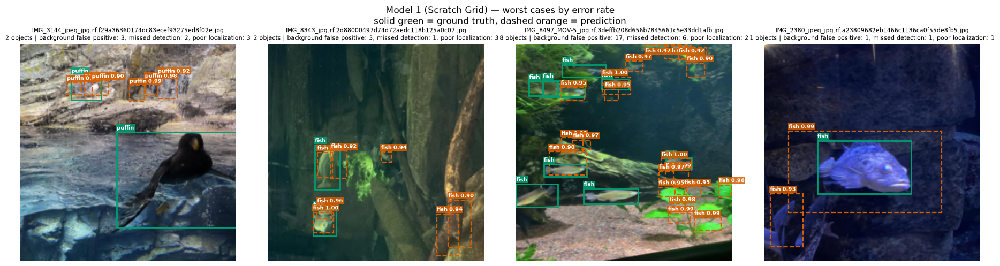

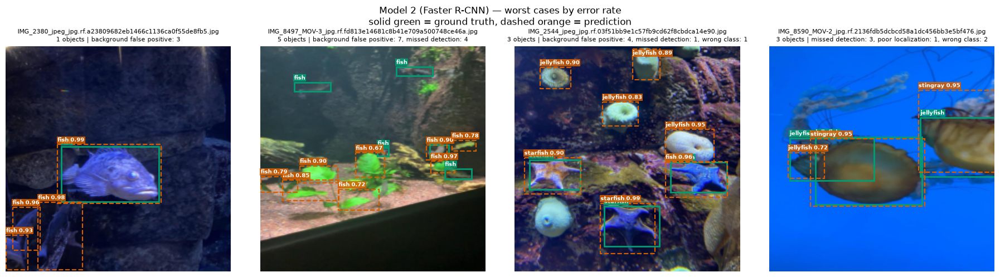

In [28]:
# --- 10.4 Worst cases, visualised --------------------------------------
for kind in ("scratch", "fasterrcnn"):
    worst = rank_worst_images(analyses[LABELS[kind]], predictions[kind], gt_test, n=4)
    test_ds = make_dataset(kind, "test")
    by_name = {f: i for i, f in enumerate(test_ds.files)}

    cases = []
    for case in worst:
        idx = by_name.get(case["image_id"])
        if idx is None:
            continue
        image = test_ds[idx][0].permute(1, 2, 0).numpy()
        pred = case["prediction"].filter_by_score(thresholds[kind])
        breakdown = ", ".join(f"{k.replace('_', ' ')}: {v}"
                              for k, v in sorted(case["breakdown"].items()))
        cases.append({
            "image": image,
            "gt": (case["ground_truth"].boxes, case["ground_truth"].labels),
            "pred": (pred.boxes, pred.scores, pred.labels),
            "caption": f"{case['image_id']}\n{case['n_gt']} objects | {breakdown}",
        })

    fig = viz.plot_failure_gallery(cases, cfg.class_names,
                                    FIGURES_DIR / f"{kind}_failures.png",
                                    title=f"{LABELS[kind]} — worst cases by error rate")
    if fig:
        plt.show()

Ranking is by errors **normalised by object count**. Without normalising, the
ranking simply returns the most crowded images every time — which says more
about the dataset than about the model.

---
# 11. Real-World Testing on Unseen Images

The guide requires testing on samples **never used** in training, validation, or
testing — including the test split, which the development process touched
indirectly through design and hyperparameter choices.

Images live in `real_world_samples/` under three subfolders, and the folder name
becomes the image's category in the output. The required normal / difficult /
failure-oriented grouping is therefore **structural**, not a note added
afterwards:

- `normal/` — clear, well-lit, few large subjects. Failure here is fundamental.
- `difficult/` — murky water, occlusion, dense schools, odd angles. In domain
  but hard; this is where the two models separate most.
- `failure_oriented/` — chosen to provoke a specific, explainable failure: an
  out-of-domain animal (neither model has a "none of the above" option), an
  empty tank (every box is unambiguously a false positive), a cartoon fish
  (tests whether the models learned shape or photographic texture).

See `real_world_samples/README.md` for sourcing and licensing guidance.

9 unseen image(s):
  [difficult] pl23_reef0078.jpg
  [difficult] pl23_reef1591.jpg
  [difficult] pl23_sanc1002.jpg
  [failure_oriented] photo_2026-08-04_01-52-22.jpg
  [failure_oriented] photo_2026-08-04_01-52-36.jpg
  [failure_oriented] pl23_reef1437.jpg
  [normal] pl23_reef1133.jpg
  [normal] pl23_reef2269.jpg
  [normal] pl23_reef2272.jpg


  pl23_reef0078.jpg                       Model 1 (Scratch Grid)      2 detections


  pl23_reef0078.jpg                       Model 2 (Faster R-CNN)      9 detections
  pl23_reef1591.jpg                       Model 1 (Scratch Grid)     67 detections


  pl23_reef1591.jpg                       Model 2 (Faster R-CNN)     29 detections
  pl23_sanc1002.jpg                       Model 1 (Scratch Grid)     41 detections


  pl23_sanc1002.jpg                       Model 2 (Faster R-CNN)     24 detections
  photo_2026-08-04_01-52-22.jpg           Model 1 (Scratch Grid)      1 detections


  photo_2026-08-04_01-52-22.jpg           Model 2 (Faster R-CNN)      0 detections
  photo_2026-08-04_01-52-36.jpg           Model 1 (Scratch Grid)      0 detections


  photo_2026-08-04_01-52-36.jpg           Model 2 (Faster R-CNN)      0 detections
  pl23_reef1437.jpg                       Model 1 (Scratch Grid)     10 detections


  pl23_reef1437.jpg                       Model 2 (Faster R-CNN)      3 detections
  pl23_reef1133.jpg                       Model 1 (Scratch Grid)      0 detections


  pl23_reef1133.jpg                       Model 2 (Faster R-CNN)      1 detections
  pl23_reef2269.jpg                       Model 1 (Scratch Grid)      0 detections


  pl23_reef2269.jpg                       Model 2 (Faster R-CNN)      2 detections
  pl23_reef2272.jpg                       Model 1 (Scratch Grid)     15 detections


  pl23_reef2272.jpg                       Model 2 (Faster R-CNN)      1 detections


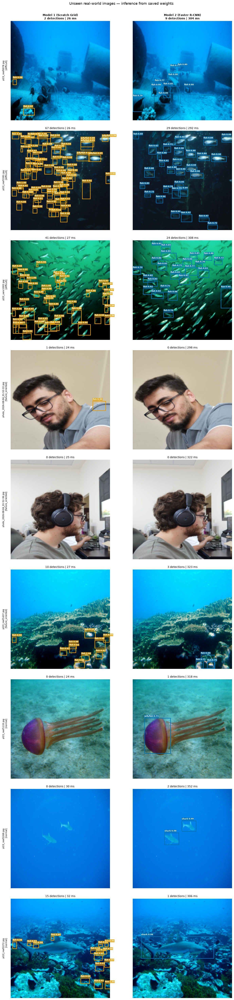

In [29]:
# --- Inference on unseen images, from saved weights only ---------------
from src.data import IMAGE_EXTENSIONS
from src.utils import Timer
import torchvision.transforms.functional as TF
from src.boxes import non_max_suppression
from src.data import decode_grid_predictions
from src.engine import EVAL_SCORE_FLOOR

real_images = sorted(
    p for p in REAL_WORLD_DIR.rglob("*")
    if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
)

if not real_images:
    print(f"No images in {REAL_WORLD_DIR}.")
    print("Add a few to normal/, difficult/ and failure_oriented/ "
          "(see real_world_samples/README.md), then rerun this cell.")
else:
    print(f"{len(real_images)} unseen image(s):")
    for p in real_images:
        print(f"  [{p.parent.name}] {p.name}")

    @torch.no_grad()
    def detect(kind, tensor):
        model, model_cfg = models[kind]
        model.eval()
        with Timer() as t:
            if kind == "scratch":
                raw = model(tensor.unsqueeze(0).to(DEVICE))[0]
                boxes, scores, labels = decode_grid_predictions(
                    raw, model_cfg.img_size, EVAL_SCORE_FLOOR)
            else:
                out = model([tensor.to(DEVICE)])[0]
                boxes = out["boxes"].cpu().numpy().astype(float)
                scores = out["scores"].cpu().numpy().astype(float)
                labels = out["labels"].cpu().numpy().astype(int) - 1
            keep = non_max_suppression(
                boxes, scores, labels,
                iou_threshold=model_cfg.nms_iou_threshold,
                score_threshold=thresholds[kind],
                max_detections=model_cfg.max_detections)
        return boxes[keep], scores[keep], labels[keep], t.elapsed

    fig, axes = plt.subplots(len(real_images), 2,
                             figsize=(13, 5.6 * len(real_images)), squeeze=False)

    for r, path in enumerate(real_images):
        with Image.open(path) as im:
            # BILINEAR, matching src/data.py and scripts/predict.py. PIL
            # defaults to BICUBIC, which produces slightly different pixels
            # and therefore a slightly different detection count than the
            # rest of the pipeline - a silent inconsistency worth avoiding.
            resized = im.convert("RGB").resize(
                (cfg.img_size, cfg.img_size), Image.BILINEAR)
        tensor = TF.to_tensor(resized)
        display_img = np.asarray(resized)

        for c, kind in enumerate(("scratch", "fasterrcnn")):
            boxes, scores, labels, seconds = detect(kind, tensor)
            viz.draw_boxes(axes[r][c], display_img, boxes, labels, scores,
                           cfg.class_names, color=viz.MODEL_COLORS[LABELS[kind]])
            axes[r][c].set_title(
                f"{LABELS[kind] if r == 0 else ''}\n"
                f"{len(boxes)} detections | {seconds*1000:.0f} ms",
                fontsize=10, weight="bold" if r == 0 else "normal")
            if c == 0:
                axes[r][c].text(-0.03, 0.5, f"{path.name}\n[{path.parent.name}]",
                                transform=axes[r][c].transAxes, rotation=90,
                                va="center", ha="right", fontsize=8)
            print(f"  {path.name:<40}{LABELS[kind]:<26}{len(boxes):>3} detections")

    fig.suptitle("Unseen real-world images — inference from saved weights",
                 fontsize=13, y=1.002)
    fig.tight_layout()
    fig.savefig(FIGURES_DIR / "real_world_results.png", dpi=150,
                bbox_inches="tight", facecolor="white")
    plt.show()

### What to record here

For each image, note in the discussion: its category, what each model got right,
what it got wrong, and **why**. The failure-oriented cases are the most
informative — a detector with no reject option must produce *something* for an
out-of-domain input, and whether it stays quiet (low confidence everywhere) or
confidently mislabels is a real property of the model worth explaining.

---
# 12. Comparison

Metric                      Model 1 (Scratch Grid)    Model 2 (Faster R-CNN)
mAP@0.5                                     0.2718                    0.5363
mAP@[.5:.95]                                0.0821                    0.2630
Precision                                   0.2730                    0.6682
Recall                                      0.2791                    0.5034
F1                                          0.2760                    0.5742
True positives                                 163                       294
False positives                                434                       146
Missed (FN)                                    421                       290
Conf. threshold                               0.90                      0.65
----------------------------------------------------------------------------
Latency median (ms)                           36.4                     434.8
Latency p95 (ms)                              40.5                     479.1

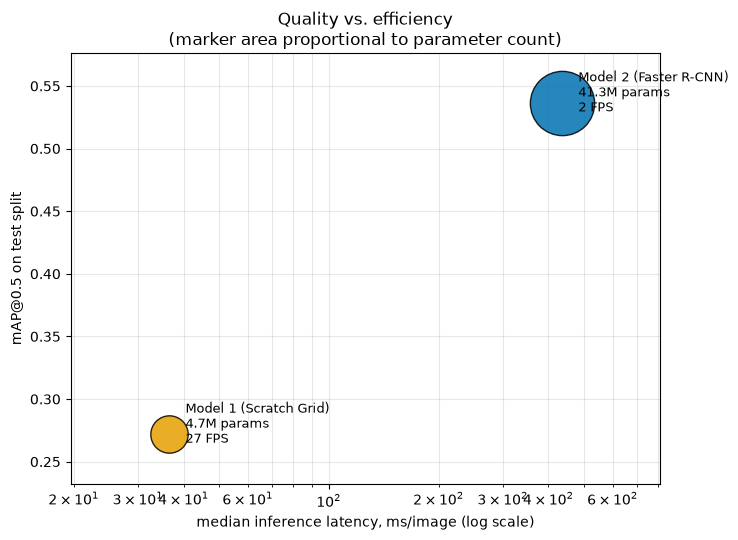

In [30]:
# --- Final comparison table --------------------------------------------
rows = []
for kind in ("scratch", "fasterrcnn"):
    model, model_cfg = models[kind]
    result = results[LABELS[kind]]
    lat = latencies[kind]
    _, _, ckpt = load_checkpoint(CKPT[kind], DEVICE)
    rows.append({
        "model": LABELS[kind],
        "map50": result.map_50,
        "map50_95": result.map_50_95,
        "precision": result.precision,
        "recall": result.recall,
        "f1": result.f1,
        "tp": result.tp, "fp": result.fp, "fn": result.fn,
        "conf": thresholds[kind],
        "latency_ms": lat["median_ms"],
        "latency_p95_ms": lat["p95_ms"],
        "fps": lat["fps"],
        "params": count_parameters(model),
        "size_mb": model_size_mb(model),
        "best_epoch": ckpt.get("epoch", "?"),
        "train_seconds": summaries[kind].get("train_seconds", float("nan")),
    })

width = 26
print(f"{'Metric':<24}" + "".join(f"{r['model']:>{width}}" for r in rows))
print("=" * (24 + width * len(rows)))

def line(label, key, fmt="{:.4f}"):
    print(f"{label:<24}" + "".join(f"{fmt.format(r[key]):>{width}}" for r in rows))

line("mAP@0.5", "map50")
line("mAP@[.5:.95]", "map50_95")
line("Precision", "precision")
line("Recall", "recall")
line("F1", "f1")
line("True positives", "tp", "{}")
line("False positives", "fp", "{}")
line("Missed (FN)", "fn", "{}")
line("Conf. threshold", "conf", "{:.2f}")
print("-" * (24 + width * len(rows)))
line("Latency median (ms)", "latency_ms", "{:.1f}")
line("Latency p95 (ms)", "latency_p95_ms", "{:.1f}")
line("Throughput (FPS)", "fps", "{:.1f}")
line("Parameters", "params", "{:,}")
line("Model size (MB)", "size_mb", "{:.1f}")
line("Best epoch", "best_epoch", "{}")
line("Training time (s)", "train_seconds", "{:.0f}")
print("=" * (24 + width * len(rows)))

fig = viz.plot_speed_accuracy(rows, FIGURES_DIR / "speed_vs_accuracy.png")
plt.show()

In [31]:
# --- Persist everything ------------------------------------------------
save_json(
    {
        "hardware": hardware_report(),
        "config": cfg.to_dict(),
        "thresholds": {LABELS[k]: v for k, v in thresholds.items()},
        "models": {r["model"]: r for r in rows},
        "detail": {name: res.summary_dict() for name, res in results.items()},
        "failures": {
            name: {
                "counts": a["counts"],
                "error_share": a["error_share"],
                "miss_rate_by_bucket": a["miss_rate_by_bucket"],
                "top_confusions": [list(c) for c in a["top_confusions"]],
            }
            for name, a in analyses.items()
        },
    },
    RESULTS_DIR / "metrics.json",
)
print(f"metrics written to {RESULTS_DIR / 'metrics.json'}")
print(f"figures in {FIGURES_DIR}: {len(list(FIGURES_DIR.glob('*.png')))} files")

metrics written to G:\03_Projects\Active\uni\nn\finalproject\results\metrics.json
figures in G:\03_Projects\Active\uni\nn\finalproject\results\figures: 20 files


---
# 13. Critical Analysis and Future Work

> Fill the bracketed slots below from the numbers your run produced. Everything
> outside the brackets holds regardless of the exact figures.

### Where each model fails, and why

**Model 1 (from scratch).** Its errors are dominated by `[dominant error type
from section 10.1]`. The miss rate on small objects versus large ones
(`[small]%` vs `[large]%`) is the clearest signal: at a 14×14 output grid each
cell covers 16×16 pixels, so an object smaller than that has almost no
positional evidence to regress from. Distinguish the causes:

- *Data* — 448 training images is very little for a detector learning visual
  features from random initialisation. This is the dominant constraint.
- *Modelling* — one box per cell and no anchors. Section 4 measured this cost
  directly.
- *Optimisation* — check the curves in section 8: if validation mAP was still
  climbing when early stopping triggered, the budget bound it; if training loss
  kept falling while validation mAP fell, it overfit.
- *Deployment* — none. It is fast and small.

**Model 2 (Faster R-CNN).** COCO pretraining supplies exactly what Model 1
lacks: features learned from 100k+ images. Its residual errors concentrate in
`[dominant error type]`, and the class confusions in section 10.2 are the
interesting part — confusions between visually similar species are a data
problem, not an architecture problem.

- *Data* — rare classes remain weak; per-class AP in section 9.3 shows which.
- *Modelling* — 224×224 input is small for a detector designed around 800px.
  This was chosen deliberately for a fair comparison, and it costs Model 2
  absolute accuracy.
- *Optimisation* — watch for the validation curve turning up while training loss
  falls. The checkpoint is taken at the validation peak, so this is diagnosed
  rather than suffered.
- *Deployment* — ~165 MB and the slower of the two by a wide margin.

### Overfitting, imbalance, and the threshold

- **Overfitting** — compare the epoch of peak validation mAP against the total
  epochs run (printed in section 8). A large gap is overfitting caught by early
  stopping.
- **Class imbalance** — the ratio measured in section 3.2 carries straight into
  per-class AP. The rare classes have few test instances, so their AP is noisy;
  treat those numbers as indicative.
- **False positives vs. missed detections** — the two are traded by the
  confidence threshold, and the sweep in section 9.1 shows the whole curve. F1
  was chosen as the selection criterion; a deployment that must not miss
  anything would pick a lower threshold and accept more false positives.

### Concrete improvements, in order of expected value

1. **More data, or stronger augmentation** — the single biggest constraint on
   Model 1. Mixup/copy-paste of cropped animals onto new backgrounds would
   multiply the effective dataset without new annotation.
2. **Anchors or multi-scale prediction for Model 1** — 2–3 anchor shapes per
   cell, or a small feature pyramid, would directly attack both the one-object-
   per-cell ceiling and the small-object miss rate. This is the highest-value
   architectural change.
3. **Higher input resolution** — 416×416 would give Model 1 a 26×26 grid and
   let Model 2 operate closer to its design point. Costs latency on both.
4. **Class-balanced sampling or focal loss** — targets the rare classes
   specifically.
5. **Quantisation or pruning for Model 2** — INT8 typically recovers 2–3× on
   latency for a small mAP cost, which is the right trade if Model 2's accuracy
   is needed at Model 1's speed.
6. **Multiple seeds** — every number here comes from a single run. Three seeds
   per model would turn point estimates into intervals and show whether an
   observed gap is real.
7. **Temporal modelling** — for video deployment, tracking across frames would
   suppress flickering false positives that single-frame detection cannot see.

---
# 14. Conclusions

*(Write these against your own numbers — the structure below is what the
discussion will ask for.)*

1. **Which model wins on quality, and by how much.** Quote mAP@0.5 and
   mAP@[.5:.95]. The second matters: a model that wins on mAP@0.5 but not on
   the stricter range wins on *finding* objects, not on *localising* them.
2. **What that quality costs.** Quote the latency ratio and the parameter
   ratio. State the operating regime where each model is the right choice.
3. **What pretraining was worth.** This is the experiment's actual result: the
   accuracy difference between an identical pipeline with and without COCO
   features, on 448 training images.
4. **What the failure analysis showed** that the aggregate metrics did not —
   specifically, which error type dominates each model and what that implies.
5. **Honest limitations.** Single seed, 63 test images, 224×224 input, one
   object per cell in Model 1, no aspect-ratio preservation.

---
# 15. References

**Dataset**
- Dwyer, B. *Aquarium Combined Dataset*. Roboflow Universe, 2021.
  https://universe.roboflow.com/brad-dwyer/aquarium-combined (CC BY 4.0)

**Papers**
- Redmon, J., Divvala, S., Girshick, R., Farhadi, A. *You Only Look Once:
  Unified, Real-Time Object Detection*. CVPR 2016. — grid encoding, multi-task
  loss weighting, and the √w/√h regression used in Model 1.
- Ren, S., He, K., Girshick, R., Sun, J. *Faster R-CNN: Towards Real-Time Object
  Detection with Region Proposal Networks*. NeurIPS 2015. — Model 2.
- Lin, T.-Y. et al. *Feature Pyramid Networks for Object Detection*. CVPR 2017.
- Lin, T.-Y. et al. *Focal Loss for Dense Object Detection*. ICCV 2017. — the
  negative objectness bias initialisation.
- He, K. et al. *Deep Residual Learning for Image Recognition*. CVPR 2016.
- Ioffe, S., Szegedy, C. *Batch Normalization*. ICML 2015.
- Everingham, M. et al. *The PASCAL Visual Object Classes Challenge*. IJCV 2010.
  — the all-point interpolated AP definition in `src/metrics.py`.

**Libraries**
- PyTorch and torchvision — https://pytorch.org
- NumPy, Matplotlib, Pillow
- Roboflow Python SDK — https://docs.roboflow.com

**Pre-trained weights**
- `FasterRCNN_ResNet50_FPN_Weights.DEFAULT` (torchvision), COCO train2017.

**AI tools**
- Claude (Anthropic) was used for code structuring, refactoring, debugging
  assistance and documentation drafting. Every design decision, experiment and
  reported result was reviewed, executed and verified by the team, and we are
  responsible for all submitted content.